In [19]:
!pip install Unidecode
!pip install fuzzysearch

!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [20]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls


# Sorting lines based on the xml files

In [1]:
from sort_xml import *
base_dir = '../../edspdf-train/data/publaynet/'

%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

### Load pdf and xml example 

In [22]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +20

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188
PMC1247189
PMC1247474
PMC1247478
PMC1247480
PMC1247485
PMC1247515
PMC1247517
PMC1247523
PMC1247562
PMC1247569
PMC1247570
PMC1247573
PMC1247606
PMC1247607
PMC1247608


In [23]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1247517/

ehp0112-001282.nxml  ehp0112-001282e2.jpg ehp0112-001282f2.gif
ehp0112-001282.pdf   ehp0112-001282f1.gif ehp0112-001282f2.jpg
ehp0112-001282e1.jpg ehp0112-001282f1.jpg


In [2]:
# file_dir = base_dir + 'xmls/PMC1247523'
# pdf_path, xml_path = get_paths(file_dir = file_dir)
# print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247523/ehp0112-001319.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247523/ehp0112-001319.pdf


## Model extractor

In [3]:
# from edspdf import Pipeline
# from edspdf.structures import Box, PDFDoc
# from edspdf.visualization.annotations import show_annotations

# # model
# model = Pipeline()
# model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

# # Read PDF
# pdf = pdf_path.read_bytes()
# doc: PDFDoc = model.get_pipe("extractor")(pdf)

# dict_page_text_boxes = {}
# for tb in doc.content_boxes:
#     if tb.page_num not in dict_page_text_boxes:
#         dict_page_text_boxes[tb.page_num] = []
#     dict_page_text_boxes[tb.page_num].append(tb)

# # pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# # for page in show_annotations(doc.content, doc.content_boxes):
# #     display(page)

#### Display XML

In [4]:
# # Read XML
# xml = open(xml_path, 'rb')
# tree = etree.parse(xml)
# # root = tree.getroot()

# printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15345346</article-id>
      <article-id pub-id-type="pmc">1247523</article-id>
    

#### Font, Body and tables text nodes

##### Front nodes matching

In [5]:
# front_nodes = get_front_nodes(tree)
# front_nodes = tqdm(front_nodes, mininterval=1)
# print(f'\n\nNb nodes {len(front_nodes)}')
# for node in front_nodes:
#     printXML(node)

100%|██████████| 5/5 [00:00<00:00, 1404.00it/s]



Nb nodes 5
<article-title xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">Neurologic Abnormalities in Workers of a 1-Bromopropane Factory</article-title>

<contrib-groups>
  <new-name>
    <given-names>Gaku</given-names>
    <surname>Ichihara</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af1-ehp0112-001319">
    <sup>1</sup>
  </xref>
  <new-name>
    <given-names>Weihua</given-names>
    <surname>Li</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af2-ehp0112-001319">
    <sup>2</sup>
  </xref>
  <new-name>
    <given-names>Eiji</given-names>
    <surname>Shibata</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af3-ehp0112-001319">
    <sup>3</sup>
  </xref>
  <new-name>
    <given-names>Xuncheng</given-names>
    <surname>Ding</surname>
  </new-name>
  <vigule>,</vigule>
  <xref ref-type="aff" rid="af2-ehp0112-001319">
    <sup>2</sup>
  </xref>
  <new-name>
    <giv

In [48]:
for tb in doc.content_boxes:
    tb.rank = None
    tb.inode = None

In [49]:
front_nodes_blocs, front_dict_blocks = get_matches(front_nodes, dict_page_text_boxes, color='yellow', bg_color='black',v=False)


------------------ 0


Node (2) text: `1FieldofSocialLifeScience,NagoyaUniversityGraduateSchoolofMedicine,Nagoya,Japan2ShanghaiInstituteofPlannedParenthoodResearch,Shanghai,China3DepartmentofHealthandPsychosocialMedicine,AichiMedicalUniversity,Aichi,Japan4DivisionofNeurobiology,DepartmentofPsychiatry,JohnsHopkinsUniversitySchoolofMedicine,Baltimore,Maryland,USA5YixingAnti-EpidemicandHealthStation,Yixing,China6DepartmentofPathology,VanderbiltUniversityMedicalCenter,Nashville,Tennessee,USA7EmeritusProfessor,NagoyaUniversity,Nagoya,Japan`
Tb text `Parenthood Research, Shanghai, China; 3Department of Health and Psychosocial Medicine, Aichi Medical University, Aichi, Japan;`
  TextBox(x0=0.07761405228758178, x1=0.8795810457516328, y0=0.16256820707070707, y1=0.17380164141414134, label=None, page_num=0, text='Parenthood Research, Shanghai, China; 3Department of Health and Psychosocial Medicine, Aichi Medical University, Aichi, Japan;', props=[TextProperties(italic=False, bold=False, begin=0,

In [50]:
n_tt = len(front_nodes)
n_mt = len(front_nodes_blocs)
print(f'Front\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for inode,node in enumerate(front_nodes):
    if inode not in front_nodes_blocs:
        print(f'    {inode}  `{" ".join(node.itertext())}`')

Front
  Nb nodes total 5
  Nb nodes matched 4
  Nb nodes not matched 1
    4  `We reported recently that 1-bromopropane (1-BP;  n -propylbromide, CAS Registry no. 106-94-5), an alternative to ozone-depleting solvents, is neurotoxic and exhibits reproductive toxicity in rats. The four most recent case reports suggested possible neurotoxicity of 1-BP in workers. The aim of the present study was to establish the neurologic effects of 1-BP in workers and examine the relationship with exposure levels. We surveyed 27 female workers in a 1-BP production factory and compared 23 of them with 23 age-matched workers in a beer factory as controls. The workers were interviewed and examined by neurologic, electrophysiologic, hematologic, biochemical, neurobehavioral, and postural sway tests. 1-BP exposure levels were estimated with passive samplers. Tests with a tuning fork showed diminished vibration sensation of the foot in 15 workers exposed to 1-BP but in none of the controls. 1-BP factory worke

##### Body nodes matching

In [10]:
# qbody='//body//title | //body//p'
# r = elementpath.select(tree, qbody)
# r2 = []

# jump = False
# for i,node in enumerate(r):
#     if jump:
#         jump = False
#         continue
#     if node.tag == 'title' and r[1+i].tag == 'p':
#         sec = etree.Element('sec')
#         sec.append(node)
#         sec.append(r[1+i])
#         r2.append(sec)
#         jump = True
#     else:
#         r2.append(node)

# body_nodes = tqdm(r2, mininterval=1)

In [51]:
body_nodes_blocs, body_dict_blocks = get_matches(body_nodes, dict_page_text_boxes, color='black', bg_color='cyan',v=False)


Before merge - page 0
  Node (2) text: `Materials and Methods`
  Nb blocks 1
  block 0
  Nb text boxes 1
  Text: `Materials and Methods`
    p-0 `Materials and Methods` -> [Match(start=0, end=19, dist=0, matched='MaterialsandMethods')] TextBox(x0=0.6538671568627451, x1=0.8515795751633987, y0=0.4199924242424242, y1=0.4338813131313132, label=None, page_num=0, text='Materials and Methods', props=[TextProperties(italic=False, bold=True, begin=0, end=21, fontname='JFDNBL+Univers-Bold')])

Merging


In [52]:
n_tt = len(body_nodes)
n_mt = len(body_nodes_blocs)
print(f'Body\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
for inode,node in enumerate(body_nodes):
    if inode not in body_nodes_blocs:
        print(f'    {inode}  `{" ".join(node.itertext())}`')

Body
  Nb nodes total 32
  Nb nodes matched 31
  Nb nodes not matched 1
    17  `The postural sway tests showed significantly lower power spectrum of the  x -axis at 2.0–1.0 Hz with eyes open and  y -axis at 0.02–0.2 Hz with eyes closed and significantly higher power spectrum of the  y -axis at 0.2–2.0 Hz with eyes closed ( Table 7 ) in the 1999 workers than in the age-matched controls, but other parameters were not significantly different between the two groups ( Table 7 ; Romberg quotients for all items, which also did not show any statistical difference, are not shown). The comparison of the 1999 workers and age-matched controls did not show any significant differences in postural sway tests ( Table 7 ; Romberg quotients not shown).`


In [31]:
inode_copy = []
for tb in doc.content_boxes:
    inode_copy.append(tb.inode)

In [54]:
inode = 17

node,blocks = body_dict_blocks[inode]

source_text = unidecode(" ".join(node.itertext()))

print(f'Node text: `{source_text}`\nNb blocks {len(blocks)}')
for iblock,block in enumerate(blocks):
    text = " | ".join([unidecode(tb.text) for tb,ret in block])
    print(f'  block {iblock}\n  Nb text boxes {len(block)}\n  Text: `{text}`')
    for rank,(tb,ret) in enumerate(block):
        print(f'    {(rank):2d} p-{tb.page_num} `{unidecode(tb.text)}` {ret} {tb}')


Node text: `The postural sway tests showed significantly lower power spectrum of the  x -axis at 2.0-1.0 Hz with eyes open and  y -axis at 0.02-0.2 Hz with eyes closed and significantly higher power spectrum of the  y -axis at 0.2-2.0 Hz with eyes closed ( Table 7 ) in the 1999 workers than in the age-matched controls, but other parameters were not significantly different between the two groups ( Table 7 ; Romberg quotients for all items, which also did not show any statistical difference, are not shown). The comparison of the 1999 workers and age-matched controls did not show any significant differences in postural sway tests ( Table 7 ; Romberg quotients not shown).`
Nb blocks 142
  block 0
  Nb text boxes 2
  Text: `0 | 2`
     0 p-1 `0` [Match(start=104, end=105, dist=0, matched='0')] TextBox(x0=0.8226321895424835, x1=0.828436111111111, y0=0.7938813131313132, y1=0.8039823232323232, label=None, page_num=1, text='0', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fon

In [44]:
# inode = 0

# node,bloc = body_dict_blocks[inode]

# source_text = unidecode(" ".join(node.itertext()))

# text = " | ".join([unidecode(tb.text) for tb in bloc])
# print(f'Node text: `{source_text}`\n Nb text boxes {len(bloc)}\nText: `{text}`')
# for rank,tb in enumerate(bloc):
#     print(f'    p-{tb.page_num} `{unidecode(tb.text)}`')


AttributeError: 'list' object has no attribute 'text'

##### Tables nodes matching

In [14]:
# qtables='//table-wrap'
# tables_nodes=elementpath.select(tree, qtables)


# qtable='//label | //caption | //tr | //table-wrap-foot'
# table_nodes = [
#     [
#         node for node in one_tns if "".join(node.itertext()) != ""
#     ]
#     for one_tns in [elementpath.select(table_tree, qtable) for table_tree in tables_nodes]
# ]

# # Merging label and caption
# for itable in range(len(table_nodes)):
#     label = None
#     caption = None
#     lc = None
#     for ind,node in enumerate(table_nodes[itable]):
#         if node.tag == 'label':
#             label = (ind,node)
#         if node.tag == 'caption':
#             caption = (ind,node)
#         if label is not None and caption is not None:
#             lc = etree.Element('label_caption')
#             lc.append(deepcopy(label[1]))
#             lc.append(deepcopy(caption[1]))
#             table_nodes[itable][label[0]] = lc
#             table_nodes[itable] = table_nodes[itable][:caption[0]] + table_nodes[itable][1+caption[0]:]
#             break

# # delete other label tags
# table_nodes_ = []
# for table in table_nodes:
#     tk_nodes = []
#     for node in table:
#         if node.tag != 'label':
#             tk_nodes.append(node)
#     table_nodes_.append(tk_nodes)
    
# table_nodes = table_nodes_

In [36]:
# itable = 0
# print(f'Nb nodes of table {itable}: {len(table_nodes[itable])}\n')
# for inode,node in enumerate(table_nodes[itable]):
#     print(f'{node.tag} {inode}\n  `{" | ".join(node.itertext())}`\n')
#     # printXML(node)
#     print('------------------')

In [41]:
table_dict_blocks = []

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic
for itable in range(len(table_nodes)):
    _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')
    table_dict_blocks.append(_tdb)


# one table

# for ic,tb in zip(inode_copy,doc.content_boxes):
#     tb.inode = ic

# itable = 3
# _tdb = get_matches(table_nodes[itable], dict_page_text_boxes, color='red', bg_color='white',v=False, r0=f't{itable}-')


------------------ 1


Node (2) text: `Age(years)36.2+-5.7a36.2+-5.2`
Tb text `36.2 ± 5.7a`
  TextBox(x0=0.8017176470588235, x1=0.852365294117647, y0=0.7358652525252525, y1=0.7471642676767677, label=None, page_num=1, text='36.2 ± 5.7a', props=[TextProperties(italic=False, bold=False, begin=0, end=10, fontname='JFDPCL+Univers-CondensedLight'), TextProperties(italic=False, bold=False, begin=10, end=11, fontname='JFDPDN+Univers-CondensedLightOblique')])
Nb blocks 1
  block 0
    Nb text boxes 1
    Text: `Age (years)`
      `Age (years)` --> TextBox(x0=0.6527777777777778, x1=0.705759477124183, y0=0.7370632575757576, y1=0.7471642676767677, label=None, page_num=1, text='Age (years)', props=[TextProperties(italic=False, bold=False, begin=0, end=11, fontname='JFDPCL+Univers-CondensedLight')])
No Follow block
  `36.2 ± 5.7a`
    [Match(start=10, end=20, dist=0, matched='36.2+-5.7a'), Match(start=20, end=29, dist=2, matched='36.2+-5.2')]

------------------ 1


Node (2) text: `Age(years)36.2+-

In [42]:
print(f'Nb tables {len(table_nodes)}')
for itable in range(len(table_nodes)):
    
    tk_nodes = table_nodes[itable]
    tk_nodes_blocs, tk_dict_blocs = table_dict_blocks[itable]

    n_tt = len(tk_nodes)
    n_mt = len(tk_nodes_blocs)
    print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
    for inode,node in enumerate(tk_nodes):
        if inode not in tk_nodes_blocs:
            print(f'    {inode}  `{" ".join(node.itertext())}`')
    


# # One table
# print(f'Nb tables {len(table_nodes)}')
# for itable in range(len(table_nodes)):
#     itable = 1
    
#     tk_nodes = table_nodes[itable]
#     # tk_nodes_blocs, tk_dict_blocs = table_dict_blocks[itable]
#     tk_nodes_blocs, tk_dict_blocs = _tdb    #   table_dict_blocks[itable]

#     n_tt = len(tk_nodes)
#     n_mt = len(tk_nodes_blocs)
#     print(f'Table {itable}\n  Nb nodes total {n_tt}\n  Nb nodes matched {n_mt}\n  Nb nodes not matched {n_tt-n_mt}')
#     for inode,node in enumerate(tk_nodes):
#         if inode not in tk_nodes_blocs:
#             print(f'    {inode}  `{" ".join(node.itertext())}`')
    
#     break

Nb tables 7
Table 0
  Nb nodes total 13
  Nb nodes matched 12
  Nb nodes not matched 1
    1  `Characteristic 1-BP exposed ( n  = 23) Control ( n  = 23)`
Table 1
  Nb nodes total 8
  Nb nodes matched 7
  Nb nodes not matched 1
    1  `1991 workers Age-matched controls for 1991 1999 workers Age-matched controls for 1999`
Table 2
  Nb nodes total 14
  Nb nodes matched 7
  Nb nodes not matched 7
    1  `1991 workers and age-matched controls ( n  = 23 pairs)
 1999 workers and age-matched controls ( n  = 12 pairs)
`
    3  `Delay time a  (sec) 1-BP workers Controls 1-BP workers Controls 1-BP workers Controls 1-BP workers Controls`
    4  `< 2 8 23 10 23 5 12 5 12`
    5  `2 0 0 1 0 0 0 1 0`
    8  `5 2 0 1 0 1 0 0 0`
    11  `10 0 0 1 0 0 0 1 0`
    12  `∞ b 1 0 0 0 0 0 0 0`
Table 3
  Nb nodes total 8
  Nb nodes matched 4
  Nb nodes not matched 4
    1  `1991 workers and age-matched controls ( n  = 23 pairs)
 1999 workers and age-matched controls ( n  = 12 pairs)
`
    3  `Delay time a  (se

In [18]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 3
inode = 0
tk_nodes = table_nodes[itable]
tk_nodes_blocs, tk_dict_blocs = table_dict_blocks[itable]# 
# tk_nodes_blocs, tk_dict_blocs = _tdb    #  table_dict_blocks[itable]# 

node,bloc = tk_dict_blocs[inode]

source_text = unidecode(" ".join(node.itertext()))

text = " | ".join([unidecode(tb.text) for tb in bloc])
print(f'Node text: `{source_text}`\nNb text boxes {len(bloc)}\nText: `{text}`')
for rank,tb in enumerate(bloc):
    tb.color = 'black'
    tb.bg_color = 'green'
    print(f'    {rank} p-{tb.page_num} `{unidecode(tb.text)}` \t{tb}')


Node text: `Table 4 Number of workers with reduced vibration sensation in the finger.`
Nb text boxes 1
Text: `Table 4. Number of workers with reduced vibration sensation in the finger.`
    0 p-3 `Table 4. Number of workers with reduced vibration sensation in the finger.` 	TextBox(x0=0.36437908496732024, x1=0.7519882352941178, y0=0.7986191919191918, y1=0.8089828282828283, label=None, page_num=3, text='Table 4. Number of workers with reduced vibration sensation in the ﬁnger.', props=[TextProperties(italic=False, bold=True, begin=0, end=8, fontname='JFDPAI+Univers-CondensedBold'), TextProperties(italic=False, bold=False, begin=9, end=73, fontname='JFDPBK+Univers-Condensed')])


In [20]:
# inode never matched fails because therefore inode not in _dict_blocs
itable = 3
inode = 2
tk_nodes = table_nodes[itable]
tk_nodes_blocs, tk_dict_blocs = table_dict_blocks[itable]   #_tdb    #   

node,blocs = tk_dict_blocs[inode]

source_text = unidecode(" ".join(node.itertext()))

print(f'Node text: `{source_text}`\nNb blocks {len(blocs)}')
for iblock,block in enumerate(blocs):
    text = " | ".join([unidecode(tb.text) for tb,ret in block])
    print(f'  block {iblock}\n  Nb text boxes {len(block)}\n  Text: `{text}`')
    for rank,(tb,ret) in enumerate(block):
        print(f'    p-{tb.page_num} `{unidecode(tb.text)}` {ret} {tb}')

Node text: `Right finger * Left finger * Right finger
 Left finger
`
Nb blocks 8
  block 0
  Nb text boxes 1
  Text: `g`
    p-2 `g` [Match(start=2, end=3, dist=0, matched='g'), Match(start=8, end=9, dist=0, matched='g'), Match(start=19, end=20, dist=0, matched='g'), Match(start=25, end=26, dist=0, matched='g'), Match(start=31, end=32, dist=0, matched='g'), Match(start=41, end=42, dist=0, matched='g')] TextBox(x0=0.26607271916666664, x1=0.27093492080065357, y0=0.20775512402777774, y1=0.21617924018939394, label=None, page_num=2, text='g', props=[TextProperties(italic=False, bold=False, begin=0, end=1, fontname='FFKEBJ+AGaramond-Regular')])
  block 1
  Nb text boxes 1
  Text: `g`
    p-2 `g` [Match(start=2, end=3, dist=0, matched='g'), Match(start=8, end=9, dist=0, matched='g'), Match(start=19, end=20, dist=0, matched='g'), Match(start=25, end=26, dist=0, matched='g'), Match(start=31, end=32, dist=0, matched='g'), Match(start=41, end=42, dist=0, matched='g')] TextBox(x0=0.209476038039215

#### Ranked text boxes

In [40]:
# doc.content_boxes[:10]

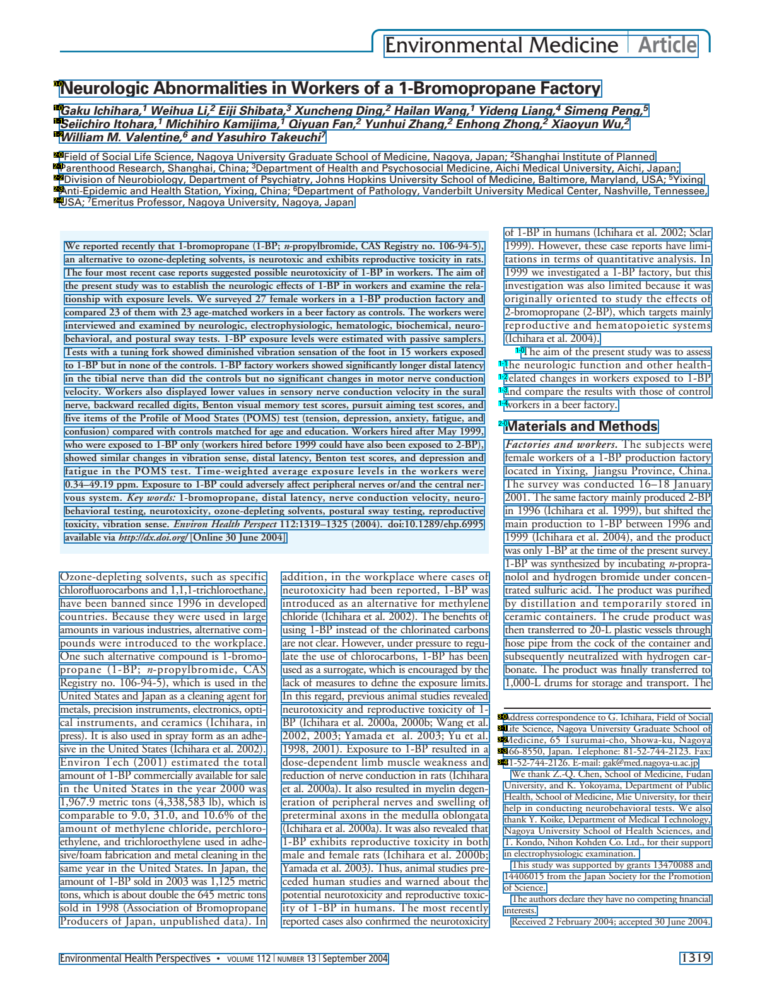

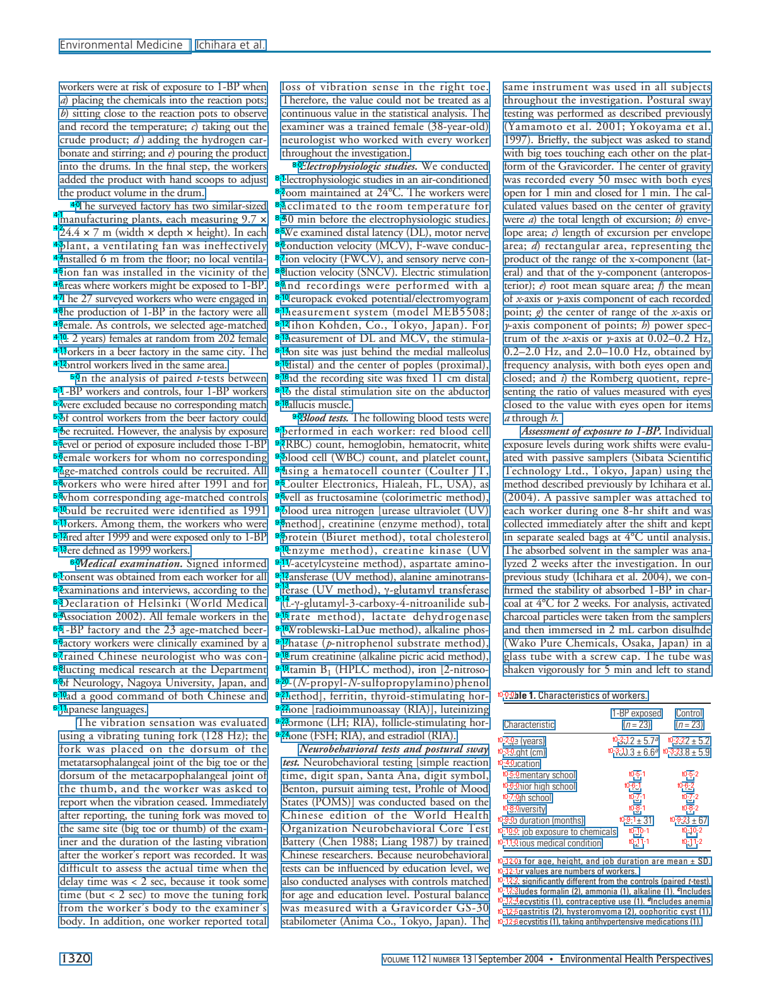

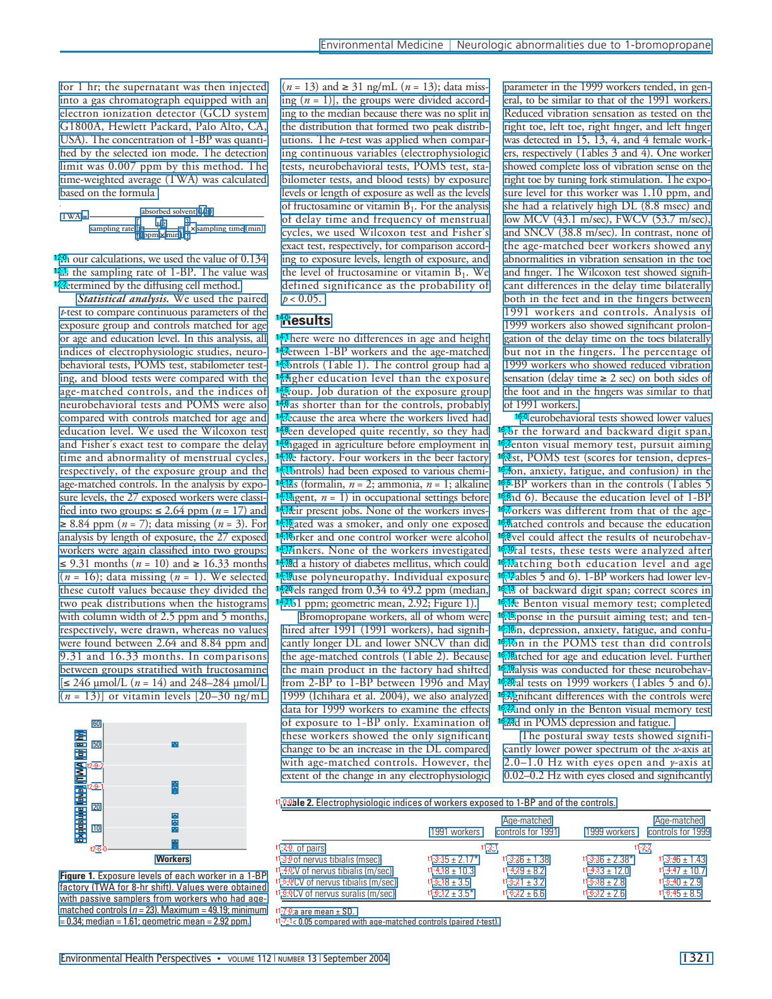

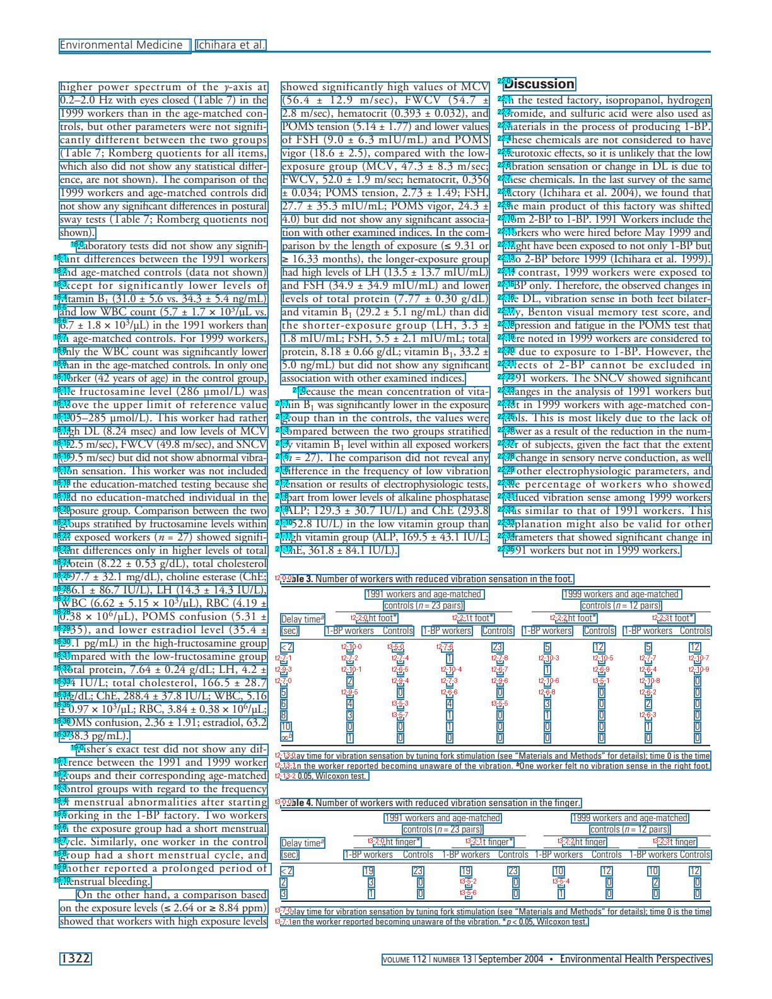

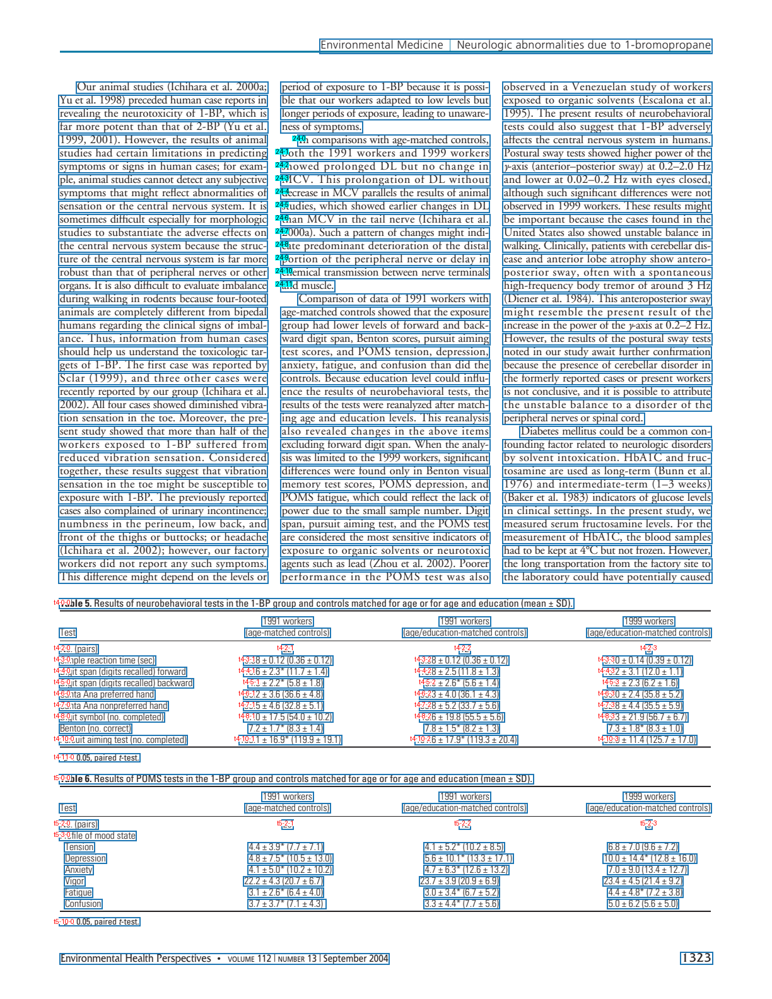

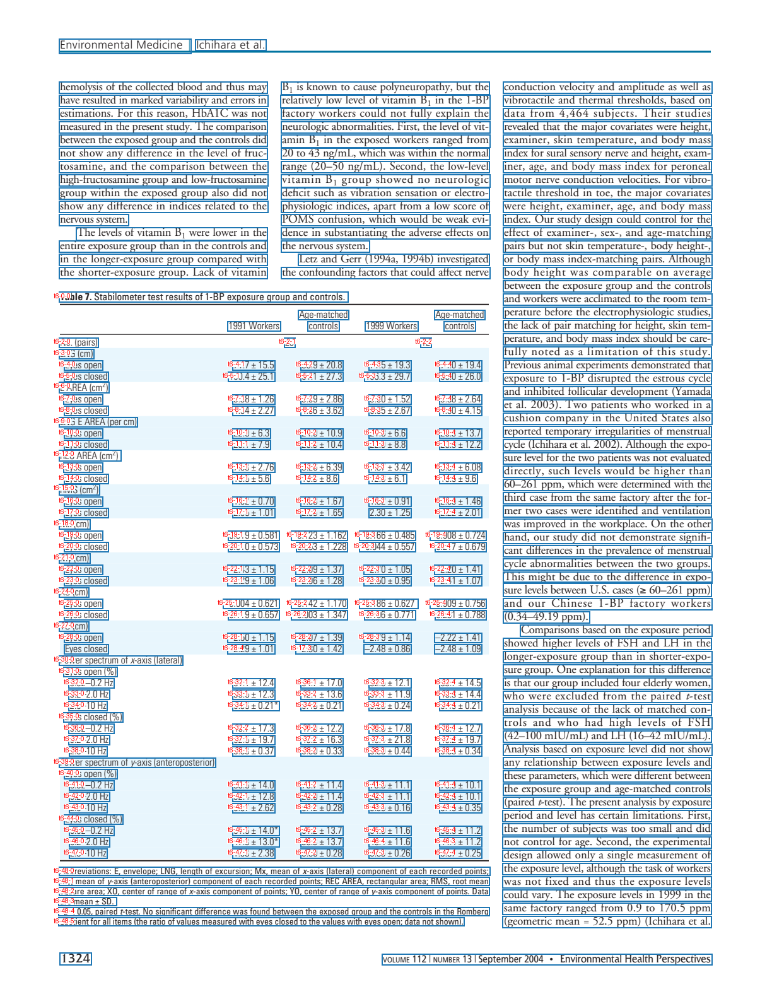

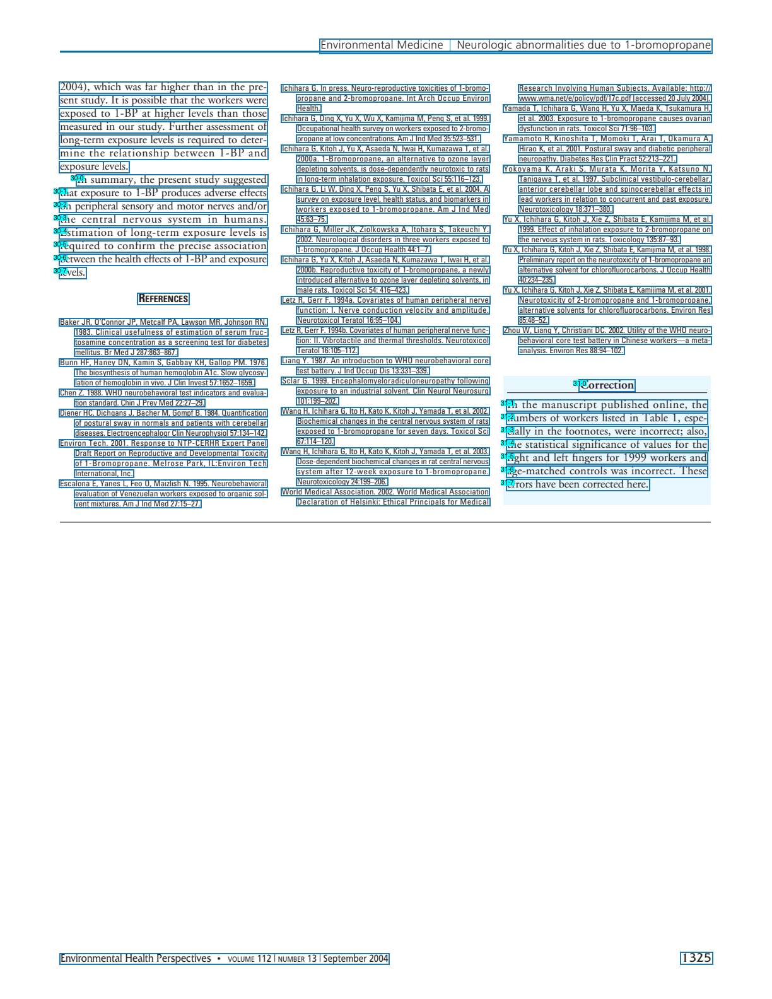

In [43]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)